In [5]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

In [2]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression

from sklearn.linear_model import Ridge

import matplotlib.pyplot as plt

from sklearn.model_selection import KFold
import warnings
warnings.filterwarnings('ignore')

from sklearn.ensemble import RandomForestRegressor

from sklearn.preprocessing import OneHotEncoder

from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

import plotly.express as px
import plotly.graph_objects as go

from matplotlib.ticker import FormatStrFormatter


In [6]:
os.chdir("../soheil")

zillow_data_dictionary = pd.read_excel('zillow_data_dictionary.xlsx')


train_2016_v2 = pd.read_csv('train_2016_v2.csv')
properties_2016 = pd.read_csv('properties_2016.csv')
#sample_submission = pd.read_csv('../input/zillow-prize-1/sample_submission.csv')
#train_2017 = pd.read_csv('../input/zillow-prize-1/train_2017.csv')
#properties_2017 = pd.read_csv('../input/zillow-prize-1/properties_2017.csv')


In [7]:
zillow_data_dictionary.head()

,Feature,Description
0,'airconditioningtypeid',Type of cooling system present in the home (i...
1,'architecturalstyletypeid',"Architectural style of the home (i.e. ranch, ..."
2,'basementsqft',Finished living area below or partially below...
3,'bathroomcnt',Number of bathrooms in home including fractio...
4,'bedroomcnt',Number of bedrooms in home


In [8]:
properties_2016.shape

(2985217, 58)

In [9]:
train_2016_v2.head()

,parcelid,logerror,transactiondate
0,11016594,0.0276,2016-01-01
1,14366692,-0.1684,2016-01-01
2,12098116,-0.0040,2016-01-01
3,12643413,0.0218,2016-01-02
4,14432541,-0.0050,2016-01-02


In [10]:
properties_2016.head()

,parcelid,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,...,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock
0,10754147,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.0,2015.0,9.0,NaN,NaN,NaN,NaN
1,10759547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,27516.0,2015.0,27516.0,NaN,NaN,NaN,NaN
2,10843547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,650756.0,1413387.0,2015.0,762631.0,20800.37,NaN,NaN,NaN
3,10859147,NaN,NaN,NaN,0.0,0.0,3.0,7.0,NaN,NaN,...,1.0,NaN,571346.0,1156834.0,2015.0,585488.0,14557.57,NaN,NaN,NaN
4,10879947,NaN,NaN,NaN,0.0,0.0,4.0,NaN,NaN,NaN,...,NaN,NaN,193796.0,433491.0,2015.0,239695.0,5725.17,NaN,NaN,NaN


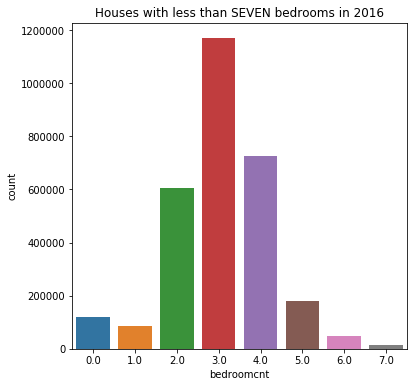

In [11]:
plt.figure(figsize = (6,6))
sns.countplot(x="bedroomcnt", data=properties_2016.loc[properties_2016['bedroomcnt']<=7]).set_title('Houses with less than SEVEN bedrooms in 2016')
plt.show()

No handles with labels found to put in legend.


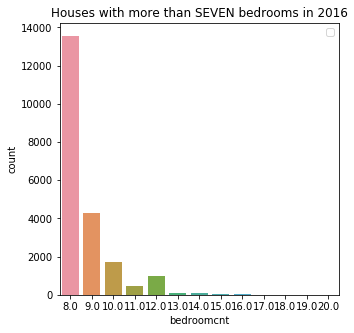

In [12]:
plt.figure(figsize = (5,5))
sns.countplot(x="bedroomcnt", data=properties_2016.loc[properties_2016['bedroomcnt']>7]).set_title('Houses with more than SEVEN bedrooms in 2016')
plt.legend()
plt.show()

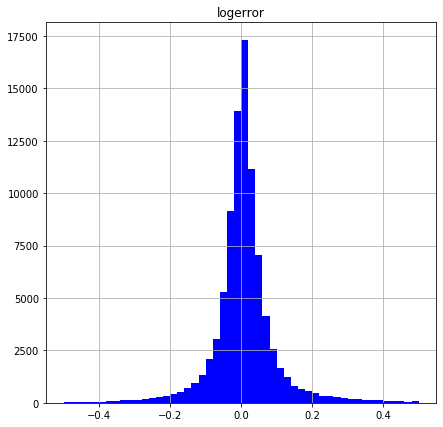

In [13]:
ax_list = train_2016_v2.hist(figsize = (7,7), column = 'logerror',range=[-.5,.5], color='blue', bins=50)


In [14]:
#Rename features 
properties_2016.rename(columns=
{
 'yearbuilt' :'build_year' ,
 'basementsqft': 'area_basement' ,
 'yardbuildingsqft17': 'area_patio'  ,
 'yardbuildingsqft26': 'area_shed'  , 
  'poolsizesum':'area_pool'  ,  
 'lotsizesquarefeet': 'area_lot'  , 
  'garagetotalsqft':'area_garage'  ,
 'finishedfloor1squarefeet': 'area_firstfloor_finished'  ,
 'calculatedfinishedsquarefeet' :'area_total_calc'  ,
 'finishedsquarefeet6' :'area_base'  ,
 'finishedsquarefeet12': 'area_live_finished'  ,
 'finishedsquarefeet13': 'area_liveperi_finished'  ,
'finishedsquarefeet15' : 'area_total_finished'  ,  
'finishedsquarefeet50':  'area_unknown'  ,
 'unitcnt' : 'num_unit' , 
 'numberofstories': 'num_story'  ,  
'roomcnt' : 'num_room' ,
 'bathroomcnt' :'num_bathroom' ,
'bedroomcnt' : 'num_bedroom' ,
 'calculatedbathnbr': 'num_bathroom_calc' ,
   'fullbathcnt':'num_bath' ,  
  'threequarterbathnbr':'num_75_bath'  , 
 'fireplacecnt': 'num_fireplace'  ,
'poolcnt' : 'num_pool'  ,  
 'garagecarcnt' :'num_garage'  ,  
 'regionidcounty': 'region_county' ,
 'regionidcity' :'region_city'  ,
 'regionidzip' :'region_zip'  ,
 'regionidneighborhood': 'region_neighbor'  ,  
  'taxvaluedollarcnt':'tax_total'  ,
 'structuretaxvaluedollarcnt': 'tax_building'  ,
'landtaxvaluedollarcnt' : 'tax_land'  ,
 'taxamount' :'tax_property' ,
  'assessmentyear':'tax_year'  ,
  'taxdelinquencyflag':'tax_delinquency'  ,
'taxdelinquencyyear' : 'tax_delinquency_year' ,
'propertyzoningdesc':  'zoning_property' ,
'propertylandusetypeid'  :'zoning_landuse'  ,
 'propertycountylandusecode': 'zoning_landuse_county'  ,
'fireplaceflag'  :'flag_fireplace'  , 
  'hashottuborspa': 'flag_tub' ,
'buildingqualitytypeid' : 'quality'  ,
 'buildingclasstypeid' :'framing'  ,
'typeconstructiontypeid':  'material'  ,
 'decktypeid'  :'deck' ,
 'storytypeid': 'story' ,
 'heatingorsystemtypeid' :'heating' ,
'airconditioningtypeid' : 'aircon' ,
'architecturalstyletypeid' : 'architectural_style' }, inplace=True)

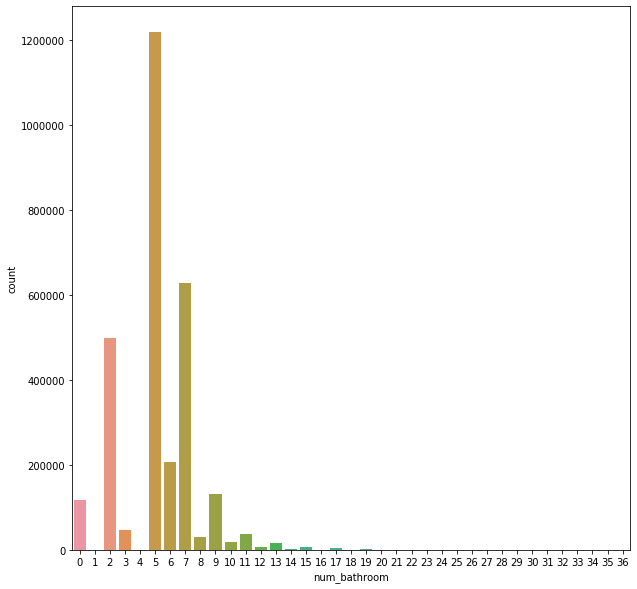

In [15]:
plt.figure(figsize=(10,10))
sns.countplot(x="num_bathroom", data=properties_2016)
formatter = FormatStrFormatter("%.0f")
plt.gca().xaxis.set_major_formatter(formatter)

In [16]:
properties_2016.head()

,parcelid,aircon,architectural_style,area_basement,num_bathroom,num_bedroom,framing,quality,num_bathroom_calc,deck,...,num_story,flag_fireplace,tax_building,tax_total,tax_year,tax_land,tax_property,tax_delinquency,tax_delinquency_year,censustractandblock
0,10754147,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.0,2015.0,9.0,NaN,NaN,NaN,NaN
1,10759547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,27516.0,2015.0,27516.0,NaN,NaN,NaN,NaN
2,10843547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,650756.0,1413387.0,2015.0,762631.0,20800.37,NaN,NaN,NaN
3,10859147,NaN,NaN,NaN,0.0,0.0,3.0,7.0,NaN,NaN,...,1.0,NaN,571346.0,1156834.0,2015.0,585488.0,14557.57,NaN,NaN,NaN
4,10879947,NaN,NaN,NaN,0.0,0.0,4.0,NaN,NaN,NaN,...,NaN,NaN,193796.0,433491.0,2015.0,239695.0,5725.17,NaN,NaN,NaN


In [17]:
train_2016_v2['absolute value of logerror']=train_2016_v2['logerror'].abs()

In [18]:
train_2016_v2['date']=pd.to_datetime(train_2016_v2['transactiondate'])

In [19]:
train_2016_v2['month']=train_2016_v2['date'].dt.month

In [20]:
train_2016_v2.head()

,parcelid,logerror,transactiondate,absolute value of logerror,date,month
0,11016594,0.0276,2016-01-01,0.0276,2016-01-01,1
1,14366692,-0.1684,2016-01-01,0.1684,2016-01-01,1
2,12098116,-0.0040,2016-01-01,0.0040,2016-01-01,1
3,12643413,0.0218,2016-01-02,0.0218,2016-01-02,1
4,14432541,-0.0050,2016-01-02,0.0050,2016-01-02,1


#Missing values
How many missing values are there for each feature?  

In [21]:
missing_values = pd.isnull(properties_2016).sum()/len(properties_2016)

In [22]:
miss_values = pd.DataFrame(data = missing_values,index = properties_2016.columns, columns =['missing values per column'])
miss_values.head()

,missing values per column
parcelid,0.000000
aircon,0.728154
architectural_style,0.997970
area_basement,0.999455
num_bathroom,0.003840


In [23]:
miss_val = miss_values.sort_values(by='missing values per column', ascending=False)

In [24]:
miss_val.head()

,missing values per column
story,0.999456
area_basement,0.999455
area_shed,0.999113
flag_fireplace,0.998270
architectural_style,0.997970


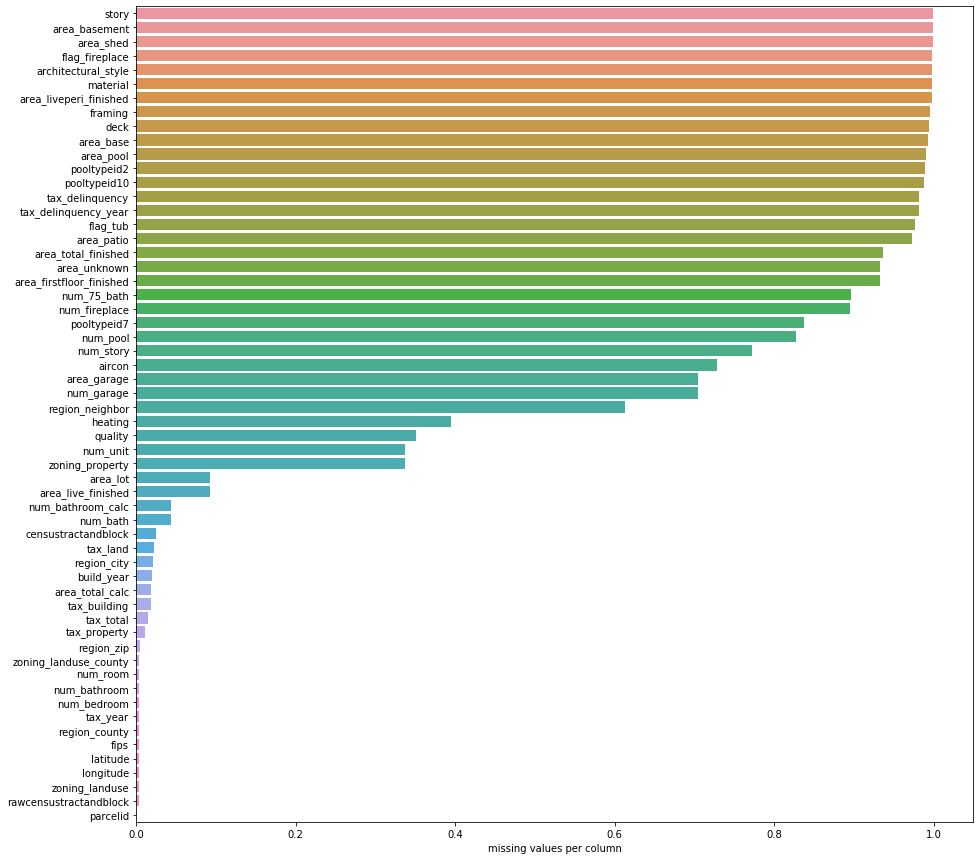

In [25]:
plt.figure(figsize=(15,15))
sns.barplot(x='missing values per column',y=miss_val.index, data =miss_val)
plt.show()

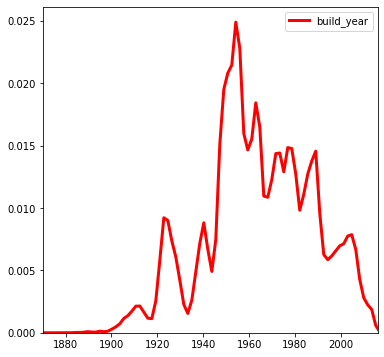

In [27]:
#When were the houses built?

plt.figure(figsize= (6,6))

sns.kdeplot(properties_2016.build_year,  color='red',linewidth=3)
plt.xlim(1870, 2016)
plt.legend()
plt.show()

In [28]:
print("Oldest house built in:",int(properties_2016.build_year.min()))

Oldest house built in: 1801


In [29]:
train_2016_v2['year']= train_2016_v2['date'].dt.year

In [30]:
train_2016_v2.head()

,parcelid,logerror,transactiondate,absolute value of logerror,date,month,year
0,11016594,0.0276,2016-01-01,0.0276,2016-01-01,1,2016
1,14366692,-0.1684,2016-01-01,0.1684,2016-01-01,1,2016
2,12098116,-0.0040,2016-01-01,0.0040,2016-01-01,1,2016
3,12643413,0.0218,2016-01-02,0.0218,2016-01-02,1,2016
4,14432541,-0.0050,2016-01-02,0.0050,2016-01-02,1,2016


In [31]:
#How does absolute log error change with time
abs_log_error_month = train_2016_v2[['absolute value of logerror', 'month']].groupby('month').mean()
abs_log_error_month

,absolute value of logerror
month,
1,0.072695
2,0.077434
3,0.072044
4,0.069972
5,0.066241
6,0.066158
7,0.065044
8,0.066104
9,0.067279


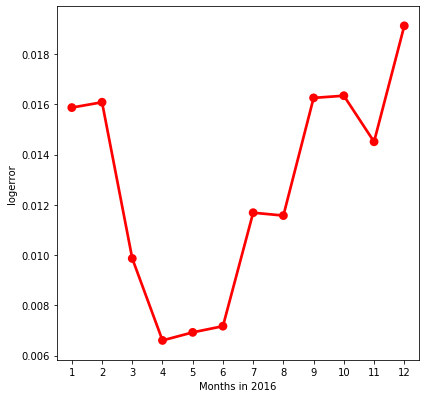

In [32]:
#How does absolute log error change with time
plt.figure(figsize=(6.5,6.5))
log_error_month = train_2016_v2[['logerror', 'month']].groupby('month').mean()
sns.pointplot(x=log_error_month.index,y=log_error_month['logerror'], data=log_error_month,color='red')
plt.xlabel('Months in 2016')
plt.show()

In [33]:
train_2016_v2.head()

,parcelid,logerror,transactiondate,absolute value of logerror,date,month,year
0,11016594,0.0276,2016-01-01,0.0276,2016-01-01,1,2016
1,14366692,-0.1684,2016-01-01,0.1684,2016-01-01,1,2016
2,12098116,-0.0040,2016-01-01,0.0040,2016-01-01,1,2016
3,12643413,0.0218,2016-01-02,0.0218,2016-01-02,1,2016
4,14432541,-0.0050,2016-01-02,0.0050,2016-01-02,1,2016


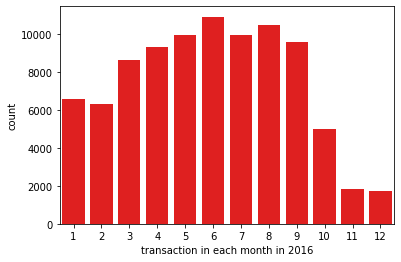

In [34]:
#Distribution of transaction dates

sns.countplot(x="month", data=train_2016_v2,color='red')
plt.xlabel('transaction in each month in 2016')
plt.show()

In [35]:
new_merge = pd.merge(train_2016_v2, properties_2016, on='parcelid')
new_merge.head()

,parcelid,logerror,transactiondate,absolute value of logerror,date,month,year,aircon,architectural_style,area_basement,...,num_story,flag_fireplace,tax_building,tax_total,tax_year,tax_land,tax_property,tax_delinquency,tax_delinquency_year,censustractandblock
0,11016594,0.0276,2016-01-01,0.0276,2016-01-01,1,2016,1.0,NaN,NaN,...,NaN,NaN,122754.0,360170.0,2015.0,237416.0,6735.88,NaN,NaN,6.037107e+13
1,14366692,-0.1684,2016-01-01,0.1684,2016-01-01,1,2016,NaN,NaN,NaN,...,NaN,NaN,346458.0,585529.0,2015.0,239071.0,10153.02,NaN,NaN,NaN
2,12098116,-0.0040,2016-01-01,0.0040,2016-01-01,1,2016,1.0,NaN,NaN,...,NaN,NaN,61994.0,119906.0,2015.0,57912.0,11484.48,NaN,NaN,6.037464e+13
3,12643413,0.0218,2016-01-02,0.0218,2016-01-02,1,2016,1.0,NaN,NaN,...,NaN,NaN,171518.0,244880.0,2015.0,73362.0,3048.74,NaN,NaN,6.037296e+13
4,14432541,-0.0050,2016-01-02,0.0050,2016-01-02,1,2016,NaN,NaN,NaN,...,2.0,NaN,169574.0,434551.0,2015.0,264977.0,5488.96,NaN,NaN,6.059042e+13


In [36]:
new_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90275 entries, 0 to 90274
Data columns (total 64 columns):
parcelid                      90275 non-null int64
logerror                      90275 non-null float64
transactiondate               90275 non-null object
absolute value of logerror    90275 non-null float64
date                          90275 non-null datetime64[ns]
month                         90275 non-null int64
year                          90275 non-null int64
aircon                        28781 non-null float64
architectural_style           261 non-null float64
area_basement                 43 non-null float64
num_bathroom                  90275 non-null float64
num_bedroom                   90275 non-null float64
framing                       16 non-null float64
quality                       57364 non-null float64
num_bathroom_calc             89093 non-null float64
deck                          658 non-null float64
area_firstfloor_finished      6856 non-null float64
a

In [37]:
new_merge.describe()

,parcelid,logerror,absolute value of logerror,month,year,aircon,architectural_style,area_basement,num_bathroom,num_bedroom,...,area_shed,build_year,num_story,tax_building,tax_total,tax_year,tax_land,tax_property,tax_delinquency_year,censustractandblock
count,9.027500e+04,90275.000000,90275.000000,90275.000000,90275.0,28781.000000,261.000000,43.000000,90275.000000,90275.000000,...,95.000000,89519.000000,20570.000000,8.989500e+04,9.027400e+04,90275.0,9.027400e+04,90269.000000,1783.000000,8.967000e+04
mean,1.298466e+07,0.011457,0.068447,5.849848,2016.0,1.816372,7.229885,713.581395,2.279474,3.031869,...,311.694737,1968.532870,1.440739,1.800934e+05,4.576726e+05,2015.0,2.783353e+05,5983.975927,13.402692,6.049151e+13
std,2.504510e+06,0.161079,0.146262,2.812690,0.0,2.974168,2.716196,437.434198,1.004271,1.156436,...,346.354850,23.763475,0.544498,2.091299e+05,5.548844e+05,0.0,4.004955e+05,6838.876956,2.715966,2.046605e+11
min,1.071174e+07,-4.605000,0.000000,1.000000,2016.0,1.000000,2.000000,100.000000,0.000000,0.000000,...,18.000000,1885.000000,1.000000,1.000000e+02,2.200000e+01,2015.0,2.200000e+01,49.080000,6.000000,6.037101e+13
25%,1.155950e+07,-0.025300,0.013900,4.000000,2016.0,1.000000,7.000000,407.500000,2.000000,2.000000,...,100.000000,1953.000000,1.000000,8.124500e+04,1.990232e+05,2015.0,8.222800e+04,2872.830000,13.000000,6.037320e+13
50%,1.254734e+07,0.006000,0.032500,6.000000,2016.0,1.000000,7.000000,616.000000,2.000000,3.000000,...,159.000000,1970.000000,1.000000,1.320000e+05,3.428720e+05,2015.0,1.929700e+05,4542.750000,14.000000,6.037615e+13
75%,1.422755e+07,0.039200,0.069400,8.000000,2016.0,1.000000,7.000000,872.000000,3.000000,4.000000,...,361.000000,1987.000000,2.000000,2.105345e+05,5.405890e+05,2015.0,3.454195e+05,6901.090000,15.000000,6.059042e+13
max,1.629608e+08,4.737000,4.737000,12.000000,2016.0,13.000000,21.000000,1555.000000,20.000000,16.000000,...,1366.000000,2015.000000,4.000000,9.948100e+06,2.775000e+07,2015.0,2.450000e+07,321936.090000,99.000000,6.111009e+13


In [38]:
#How does the absolute logerror change with build_year?

#First, let’s join the two tables together on the parcelid column 
# such that we only include properties that have a target value in train_2016.

logerror_buildyear = new_merge[['absolute value of logerror', 'build_year']].groupby('build_year').mean()

#sns.pointplot(x=log_error_month.index,y=log_error_month['logerror'], data=logerror_buildyear,color='red')


In [39]:
logerror_buildyear.head()

,absolute value of logerror
build_year,
1885.0,0.057133
1886.0,0.001000
1887.0,0.008000
1888.0,0.069200
1890.0,0.103906


<Figure size 720x720 with 0 Axes>

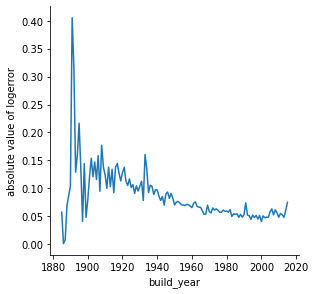

In [40]:
plt.figure(figsize=(10,10))
sns.relplot(x=logerror_buildyear.index, y="absolute value of logerror", ci="sd",kind="line", data=logerror_buildyear)
plt.xlabel('build_year')
plt.show()

(1880, 2016)

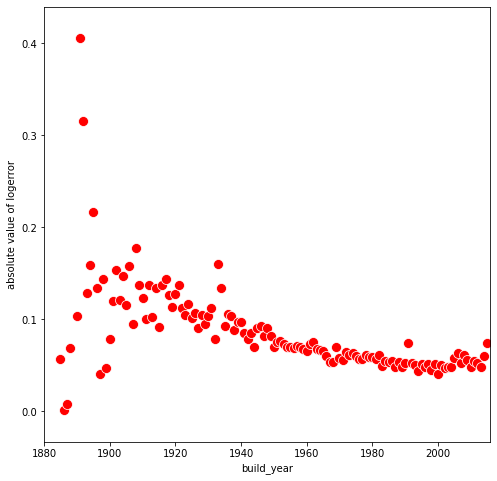

In [41]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=logerror_buildyear.index, y="absolute value of logerror",  data=logerror_buildyear, color='red',s=100)
plt.xlim(1880,2016)


In [42]:
logerror_buildyear.reset_index(inplace=True)

In [43]:
logerror_buildyear.head()

,build_year,absolute value of logerror
0,1885.0,0.057133
1,1886.0,0.001000
2,1887.0,0.008000
3,1888.0,0.069200
4,1890.0,0.103906


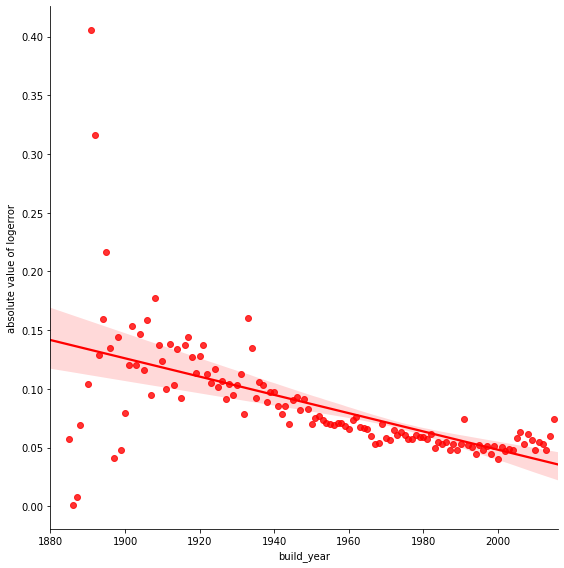

In [44]:
sns.lmplot(x="build_year", y="absolute value of logerror",size=8, data=logerror_buildyear,line_kws={'color': 'red'}, scatter_kws={'color': 'red'})
plt.xlim(1880,2016);


In [45]:
reallogerror_buildyear = new_merge[['logerror', 'build_year']].groupby('build_year').mean()
reallogerror_buildyear.reset_index(inplace=True)

In [46]:
reallogerror_buildyear.head()

,build_year,logerror
0,1885.0,0.046967
1,1886.0,-0.001000
2,1887.0,0.008000
3,1888.0,-0.069200
4,1890.0,0.031506


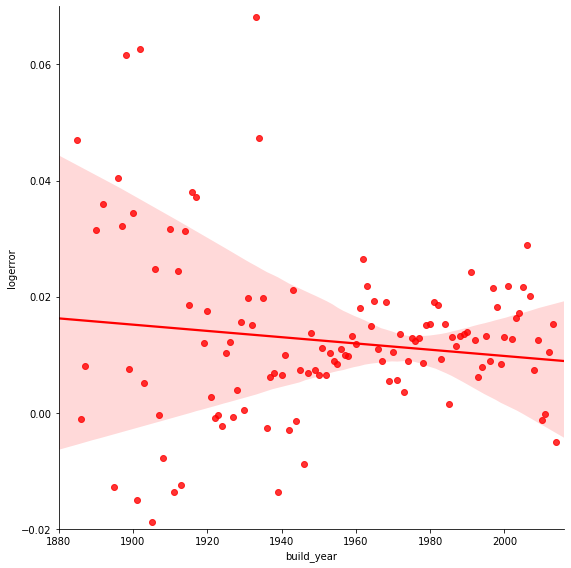

In [47]:
sns.lmplot(x="build_year", y="logerror",size=8, data=reallogerror_buildyear,line_kws={'color': 'red'}, scatter_kws={'color': 'red'})
plt.xlim(1880,2016);
plt.ylim(-.02,0.07);


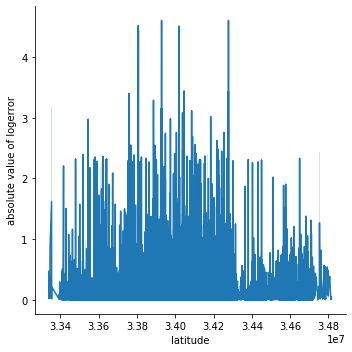

In [48]:
sns.relplot(x="latitude", y="absolute value of logerror", data=new_merge,kind='line')
plt.show()

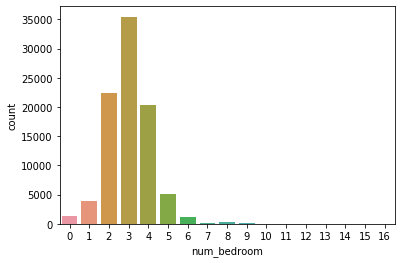

In [49]:
sns.countplot(x="num_bedroom" ,data=new_merge )
formatter = FormatStrFormatter("%.0f")
plt.gca().xaxis.set_major_formatter(formatter)

new_merge.plot(x="latitude", y="absolute value of logerror")

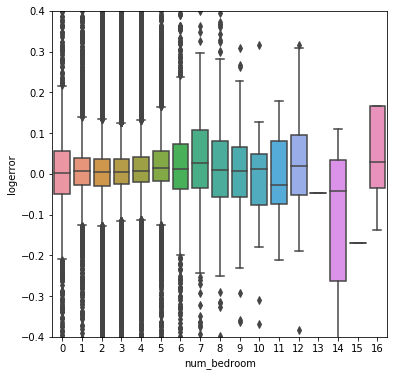

In [50]:
plt.figure(figsize=(6,6))
sns.boxplot(x="num_bedroom" ,y="logerror", data=new_merge, )
plt.ylim(-.4,.4)

formatter = FormatStrFormatter("%.0f")
plt.gca().xaxis.set_major_formatter(formatter)


In [51]:
fig = px.scatter(new_merge,  x='longitude',y='latitude')
fig.show()

In [52]:
train_2016_v2.head()

,parcelid,logerror,transactiondate,absolute value of logerror,date,month,year
0,11016594,0.0276,2016-01-01,0.0276,2016-01-01,1,2016
1,14366692,-0.1684,2016-01-01,0.1684,2016-01-01,1,2016
2,12098116,-0.0040,2016-01-01,0.0040,2016-01-01,1,2016
3,12643413,0.0218,2016-01-02,0.0218,2016-01-02,1,2016
4,14432541,-0.0050,2016-01-02,0.0050,2016-01-02,1,2016


In [53]:
fig = px.line(new_merge, x='date', y='absolute value of logerror')
fig.show()

<Figure size 648x648 with 0 Axes>

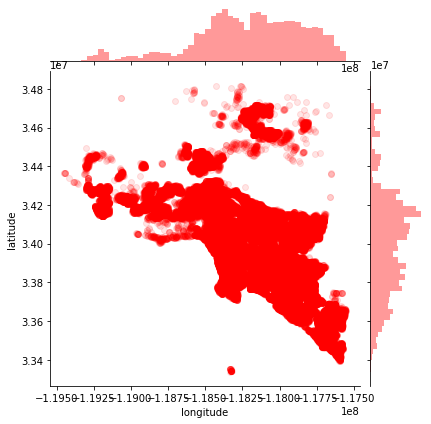

In [54]:
plt.figure(figsize=(9,9))
sns.jointplot(x='longitude',y='latitude', data=new_merge, color ='red', alpha=0.1);
plt.show()

In [55]:
corr_list = new_merge.corr()['logerror'].sort_values(ascending=False)

In [56]:
corr = pd.DataFrame(data= corr_list, index = corr_list.index)

In [57]:
corr[corr.index[0]]

logerror                      1.000000
area_basement                 0.253395
absolute value of logerror    0.237380
area_shed                     0.086179
area_live_finished            0.041922
area_total_calc               0.038784
area_base                     0.036847
area_liveperi_finished        0.034715
num_75_bath                   0.034069
num_fireplace                 0.033235
num_bathroom_calc             0.029448
num_bath                      0.028845
num_bathroom                  0.027889
num_garage                    0.026531
area_firstfloor_finished      0.026242
num_bedroom                   0.025467
area_garage                   0.023888
area_unknown                  0.023619
tax_building                  0.022085
area_total_finished           0.019327
build_year                    0.017312
num_story                     0.013075
censustractandblock           0.008892
rawcensustractandblock        0.008376
fips                          0.008363
tax_total                

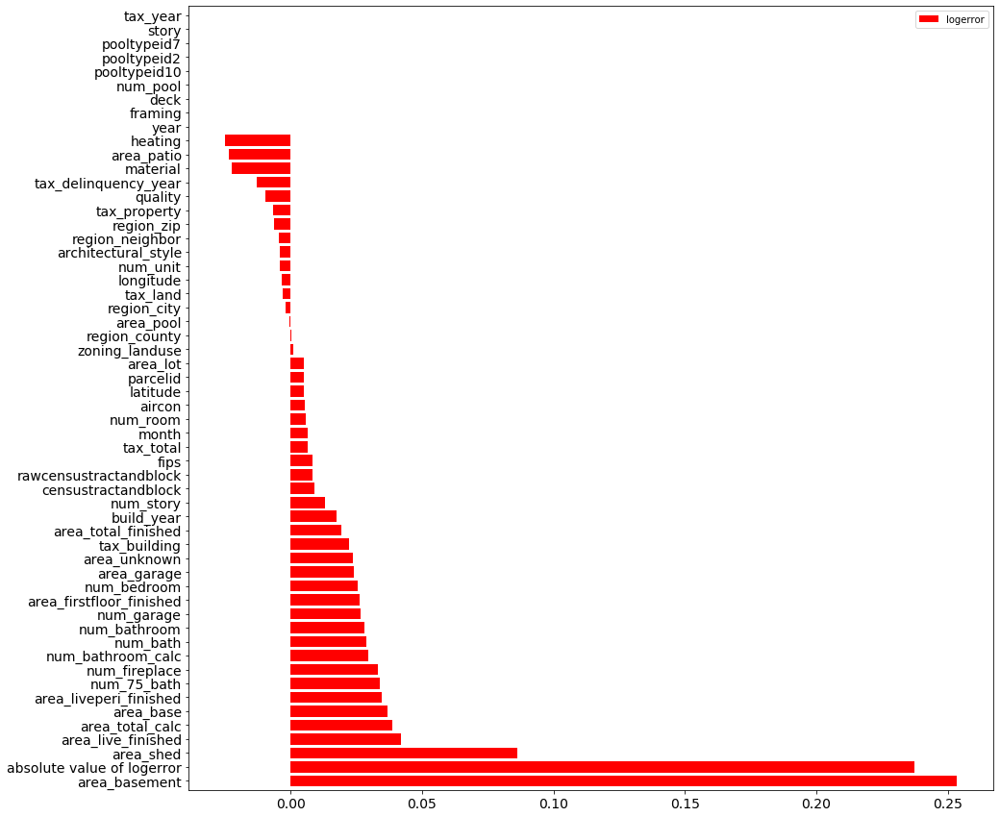

In [58]:
corr[1:].plot(kind='barh',y='logerror', color='red',fontsize=14,  figsize=(15,15), width=0.8)
plt.show()

In [59]:
#Using XGBoost
import xgboost as xgb

In [60]:
new_merge.head()

,parcelid,logerror,transactiondate,absolute value of logerror,date,month,year,aircon,architectural_style,area_basement,...,num_story,flag_fireplace,tax_building,tax_total,tax_year,tax_land,tax_property,tax_delinquency,tax_delinquency_year,censustractandblock
0,11016594,0.0276,2016-01-01,0.0276,2016-01-01,1,2016,1.0,NaN,NaN,...,NaN,NaN,122754.0,360170.0,2015.0,237416.0,6735.88,NaN,NaN,6.037107e+13
1,14366692,-0.1684,2016-01-01,0.1684,2016-01-01,1,2016,NaN,NaN,NaN,...,NaN,NaN,346458.0,585529.0,2015.0,239071.0,10153.02,NaN,NaN,NaN
2,12098116,-0.0040,2016-01-01,0.0040,2016-01-01,1,2016,1.0,NaN,NaN,...,NaN,NaN,61994.0,119906.0,2015.0,57912.0,11484.48,NaN,NaN,6.037464e+13
3,12643413,0.0218,2016-01-02,0.0218,2016-01-02,1,2016,1.0,NaN,NaN,...,NaN,NaN,171518.0,244880.0,2015.0,73362.0,3048.74,NaN,NaN,6.037296e+13
4,14432541,-0.0050,2016-01-02,0.0050,2016-01-02,1,2016,NaN,NaN,NaN,...,2.0,NaN,169574.0,434551.0,2015.0,264977.0,5488.96,NaN,NaN,6.059042e+13


In [61]:
pd.set_option('display.max_rows', 500)

(pd.isnull(new_merge).sum()/len(new_merge) *100).sort_values(ascending=False)

framing                       99.982276
area_liveperi_finished        99.963445
story                         99.952368
area_basement                 99.952368
area_shed                     99.894766
flag_fireplace                99.754085
architectural_style           99.710883
material                      99.668790
area_base                     99.533647
deck                          99.271116
area_pool                     98.926613
pooltypeid10                  98.713930
pooltypeid2                   98.666297
tax_delinquency               98.024924
tax_delinquency_year          98.024924
flag_tub                      97.380227
area_patio                    97.068956
area_total_finished           96.052063
area_firstfloor_finished      92.405428
area_unknown                  92.405428
num_fireplace                 89.358073
num_75_bath                   86.697314
pooltypeid7                   81.504292
num_pool                      80.170590
num_story                     77.214068


In [62]:
A = (pd.isnull(new_merge).sum()/len(new_merge)<0.3).reset_index()
new_merge = new_merge[A[A[0]==True]['index']]

In [63]:
new_merge.columns

Index(['parcelid', 'logerror', 'transactiondate', 'absolute value of logerror',
       'date', 'month', 'year', 'num_bathroom', 'num_bedroom',
       'num_bathroom_calc', 'area_total_calc', 'area_live_finished', 'fips',
       'num_bath', 'latitude', 'longitude', 'area_lot',
       'zoning_landuse_county', 'zoning_landuse', 'rawcensustractandblock',
       'region_city', 'region_county', 'region_zip', 'num_room', 'build_year',
       'tax_building', 'tax_total', 'tax_year', 'tax_land', 'tax_property',
       'censustractandblock'],
      dtype='object')

In [64]:
y = new_merge['logerror']

In [65]:
new_merge.drop(columns=['parcelid', 'transactiondate','absolute value of logerror'], inplace=True)

In [66]:
new_merge.drop(columns=['date'], inplace=True)

In [67]:
new_merge.fillna(0, inplace=True)

In [68]:
new_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90275 entries, 0 to 90274
Data columns (total 27 columns):
logerror                  90275 non-null float64
month                     90275 non-null int64
year                      90275 non-null int64
num_bathroom              90275 non-null float64
num_bedroom               90275 non-null float64
num_bathroom_calc         90275 non-null float64
area_total_calc           90275 non-null float64
area_live_finished        90275 non-null float64
fips                      90275 non-null float64
num_bath                  90275 non-null float64
latitude                  90275 non-null float64
longitude                 90275 non-null float64
area_lot                  90275 non-null float64
zoning_landuse_county     90275 non-null object
zoning_landuse            90275 non-null float64
rawcensustractandblock    90275 non-null float64
region_city               90275 non-null float64
region_county             90275 non-null float64
region_zip    

In [69]:
#Convert categorical variable into dummy/indicator variables.
X_dummy = pd.get_dummies(new_merge.drop(['logerror'], axis=1), drop_first=True)

In [70]:
#Standardize features by removing the mean and scaling to unit variance
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_dummy)

In [71]:
data_dmatrix = xgb.DMatrix(data=X_scaled,label=y)

params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1, 'max_depth': 5, 'alpha': 10}

cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50, early_stopping_rounds=10, metrics="mae", as_pandas=True, seed=42, verbose_eval =True)

[0]	train-mae:0.448987+3.47083e-05	test-mae:0.448988+0.000124839
[1]	train-mae:0.406025+5.21685e-05	test-mae:0.406028+0.000148787
[2]	train-mae:0.367544+8.15148e-05	test-mae:0.367551+0.000169855
[3]	train-mae:0.333096+0.000110818	test-mae:0.333106+0.00019089
[4]	train-mae:0.302287+0.000135598	test-mae:0.302303+0.000213285
[5]	train-mae:0.274762+0.000167683	test-mae:0.274783+0.000225404
[6]	train-mae:0.250185+0.000191427	test-mae:0.25021+0.000232518
[7]	train-mae:0.228274+0.000207649	test-mae:0.228301+0.000238161
[8]	train-mae:0.208749+0.000220101	test-mae:0.208779+0.000239255
[9]	train-mae:0.191381+0.000231477	test-mae:0.191419+0.000243216
[10]	train-mae:0.175952+0.0002405	test-mae:0.175994+0.000235222
[11]	train-mae:0.162253+0.000249228	test-mae:0.162298+0.000232144
[12]	train-mae:0.15011+0.000254776	test-mae:0.15016+0.000219888
[13]	train-mae:0.139376+0.000261359	test-mae:0.139429+0.000214528
[14]	train-mae:0.129901+0.000264528	test-mae:0.129954+0.000203624
[15]	train-mae:0.121553+0.